In [1]:
import os
import matplotlib.pyplot as plt
import numpy as np
import tensorflow
import pandas as pd
import albumentations
import cv2

import keras
import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import *
from tensorflow.keras.callbacks import ModelCheckpoint

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
print(tf.__version__)
print(keras.__version__)
!nvidia-smi

2.12.0

2.12.0

Tue Oct 17 08:21:03 2023       

+-----------------------------------------------------------------------------+

| NVIDIA-SMI 470.161.03   Driver Version: 470.161.03   CUDA Version: 11.4     |

|-------------------------------+----------------------+----------------------+

| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |

| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |

|                               |                      |               MIG M. |

|===============================+======================+======================|

|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |

| N/A   36C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |

|                               |                      |                  N/A |

+-------------------------------+----------------------+----------------------+

                                                            

# Metrics

In [2]:
#intersection over union
def iou(y_true, y_pred, smooth = 0.5):
    intersection = K.sum(y_true * y_pred)
    sum_ = K.sum(y_true + y_pred)
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    return jac


# Computing Sensitivity      
def sensitivity(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    return true_positives / (possible_positives + K.epsilon())

# Computing Specificity
def specificity(y_true, y_pred):
    true_negatives = K.sum(K.round(K.clip((1-y_true) * (1-y_pred), 0, 1)))
    possible_negatives = K.sum(K.round(K.clip(1-y_true, 0, 1)))
    return true_negatives / (possible_negatives + K.epsilon())

def f1_score(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    recall = true_positives / (possible_positives + K.epsilon())
    f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())
    return f1_val

# Define Dice coefficient metric
def dice_coefficient(y_true, y_pred, epsilon=1e-6):
    y_true_flat = tf.reshape(y_true, [-1])
    y_pred_flat = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_flat * y_pred_flat)
    dice_score = (2.0 * intersection + epsilon) / (tf.reduce_sum(y_true_flat) + tf.reduce_sum(y_pred_flat) + epsilon)
    return dice_score



In [3]:
def tversky(y_true, y_pred, smooth=1, alpha=0.7):
    y_true_pos = K.flatten(y_true)
    y_pred_pos = K.flatten(y_pred)
    true_pos = K.sum(y_true_pos * y_pred_pos)
    false_neg = K.sum(y_true_pos * (1 - y_pred_pos))
    false_pos = K.sum((1 - y_true_pos) * y_pred_pos)
    return (true_pos + smooth) / (true_pos + alpha * false_neg + (1 - alpha) * false_pos + smooth)

def tversky_loss(y_true, y_pred):
    return 1 - tversky(y_true, y_pred)

def focal_tversky_loss(y_true, y_pred, gamma=0.75):
    tv = tversky(y_true, y_pred)
    return K.pow((1 - tv), gamma)

# CallBacks

In [4]:
epochs = 10

earlystop = keras.callbacks.EarlyStopping(monitor='val_loss',
                          min_delta=0,
                          patience=epochs,
                          verbose=1,
                          restore_best_weights=True
                          )

reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                              factor=0.2,
                              patience=5,
                              verbose=1,
                              min_delta=0.0001)
csv_logger = keras.callbacks.CSVLogger('Model.log')


callbacks = [earlystop, csv_logger, reduce_lr]

In [6]:
prefix = '/kaggle/input/covid-segmentation/'

images_radiopedia = np.load(os.path.join(prefix, 'images_radiopedia.npy')).astype(np.float32)
masks_radiopedia = np.load(os.path.join(prefix, 'masks_radiopedia.npy')).astype(np.int8)
images_medseg = np.load(os.path.join(prefix, 'images_medseg.npy')).astype(np.float32)
masks_medseg = np.load(os.path.join(prefix, 'masks_medseg.npy')).astype(np.int8)

test_images_medseg = np.load(os.path.join(prefix, 'test_images_medseg.npy')).astype(np.float32)

In [7]:
def visualize(image_batch, mask_batch=None, pred_batch=None, num_samples = 8):
    num_classes = mask_batch.shape[-1] if mask_batch is not None else 0
    fix, ax = plt.subplots(num_classes + 1, num_samples, figsize=(num_samples * 2, (num_classes + 1) * 2))

    for i in range(num_samples):
        ax_image = ax[0, i] if num_classes > 0 else ax[i]
        ax_image.imshow(image_batch[i,:,:,0], cmap='Greys')
        ax_image.set_xticks([]) 
        ax_image.set_yticks([])
        
        if mask_batch is not None:
            for j in range(num_classes):
                if pred_batch is None:
                    mask_to_show = mask_batch[i,:,:,j]
                else:
                    mask_to_show = np.zeros(shape=(*mask_batch.shape[1:-1], 3)) 
                    mask_to_show[..., 0] = pred_batch[i,:,:,j] > 0.5
                    mask_to_show[..., 1] = mask_batch[i,:,:,j]
                ax[j + 1, i].imshow(mask_to_show, vmin=0, vmax=1)
                ax[j + 1, i].set_xticks([]) 
                ax[j + 1, i].set_yticks([]) 

    plt.tight_layout()
    plt.show()

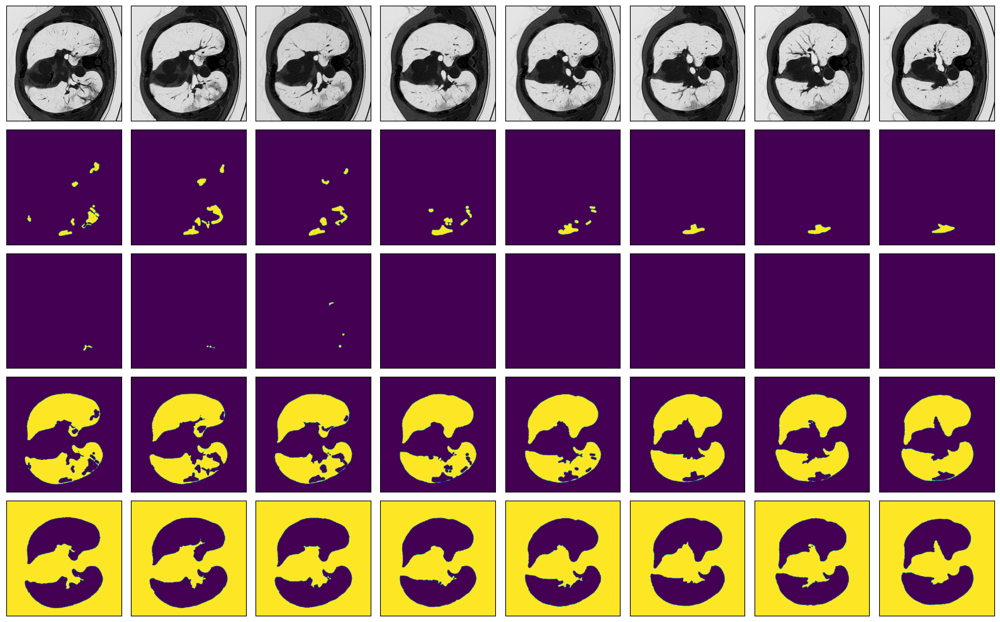

In [8]:
visualize(images_radiopedia[30:], masks_radiopedia[30:])

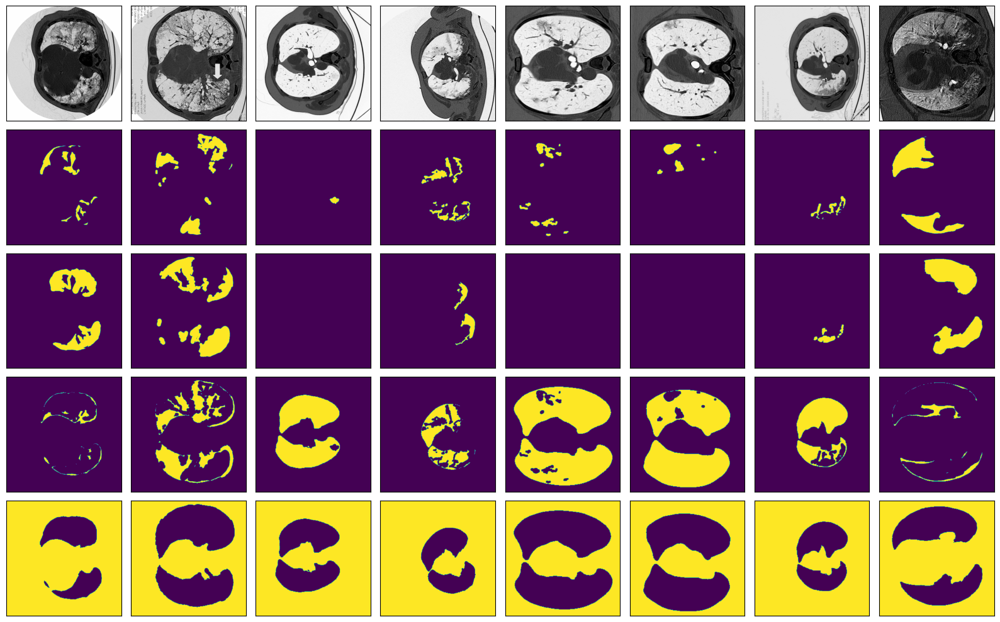

In [9]:
visualize(images_medseg, masks_medseg)

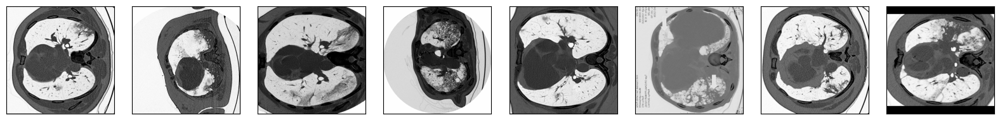

In [10]:
visualize(test_images_medseg)

In [11]:
def plot_hists(images1, images2=None):
    plt.hist(images1.ravel(), bins=100, density=True, color='b', alpha=1 if images2 is None else 0.5)
    if images2 is not None:
        plt.hist(images2.ravel(), bins=100, density=True, alpha=0.5, color='orange')
    plt.show();

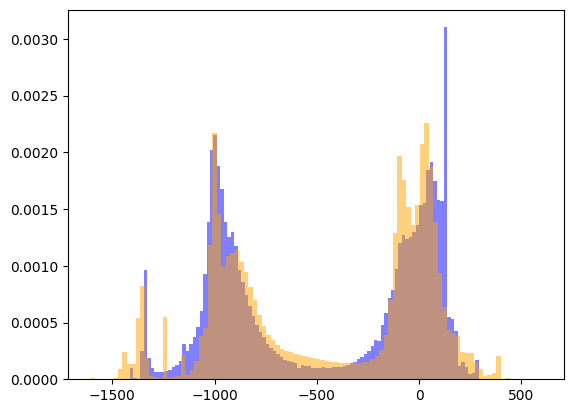

In [12]:
plot_hists(images_radiopedia, images_medseg)

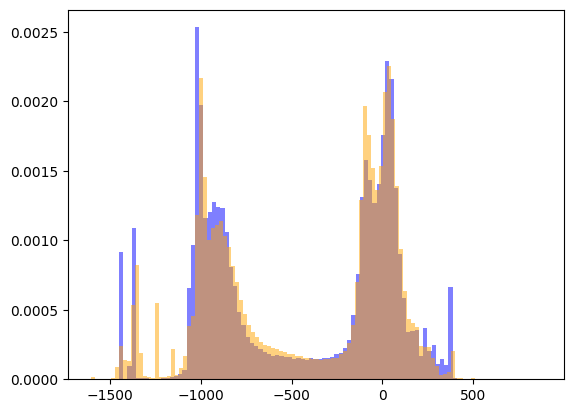

In [13]:
plot_hists(test_images_medseg, images_medseg)

In [14]:
def preprocess_images(images_arr, mean_std=None):
    images_arr[images_arr > 500] = 500
    images_arr[images_arr < -1500] = -1500
    min_perc, max_perc = np.percentile(images_arr, 5), np.percentile(images_arr, 95)
    images_arr_valid = images_arr[(images_arr > min_perc) & (images_arr < max_perc)]
    mean, std = (images_arr_valid.mean(), images_arr_valid.std()) if mean_std is None else mean_std
    images_arr = (images_arr - mean) / std
    print(f'mean {mean}, std {std}')
    return images_arr, (mean, std)

images_radiopedia, mean_std = preprocess_images(images_radiopedia)
images_medseg, _ = preprocess_images(images_medseg, mean_std)
test_images_medseg, _ = preprocess_images(test_images_medseg, mean_std)

mean -451.6488342285156, std 458.5679016113281

mean -451.6488342285156, std 458.5679016113281

mean -451.6488342285156, std 458.5679016113281


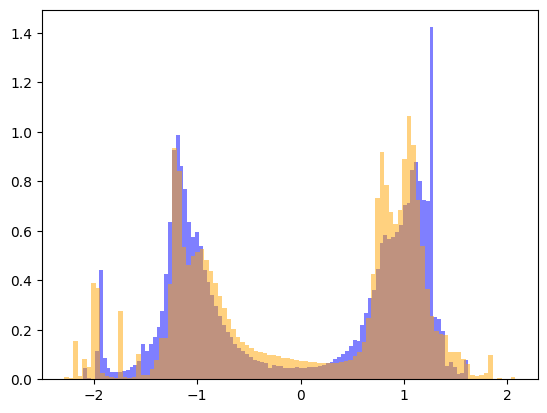

In [15]:
plot_hists(images_radiopedia, images_medseg)

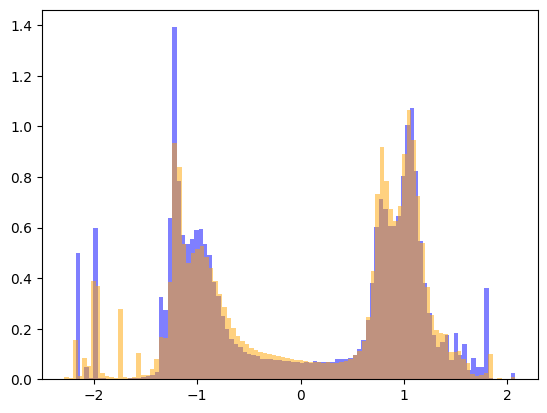

In [16]:
plot_hists(test_images_medseg, images_medseg)

In [17]:
val_indexes, train_indexes = list(range(24)), list(range(24, 100))

train_images = np.concatenate((images_medseg[train_indexes], images_radiopedia))
train_masks = np.concatenate((masks_medseg[train_indexes], masks_radiopedia))
val_images = images_medseg[val_indexes]
val_masks = masks_medseg[val_indexes]

batch_size = len(val_masks)


In [8]:
SOURCE_SIZE = 512
TARGET_SIZE = 224

train_augs = albumentations.Compose([
    albumentations.Rotate(limit=360, p=0.9, border_mode = cv2.BORDER_REPLICATE),
    albumentations.RandomSizedCrop((int(SOURCE_SIZE * 0.75), SOURCE_SIZE), 
                                   TARGET_SIZE, 
                                   TARGET_SIZE, 
                                   interpolation = cv2.INTER_NEAREST),
    albumentations.HorizontalFlip(p=0.5),

])

val_augs = albumentations.Compose([
    albumentations.Resize(TARGET_SIZE, TARGET_SIZE, interpolation = cv2.INTER_NEAREST)
])

In [19]:
class Dataset:   
    def __init__(
            self, 
            images, 
            masks,
            augmentations=None
    ):
        self.images = images
        self.masks = masks
        self.augmentations = augmentations
    
    def __getitem__(self, i):
        image = self.images[i]
        mask = self.masks[i]
        
        if self.augmentations:
            sample = self.augmentations(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
        return image, mask
        
    def __len__(self):
        return len(self.images)
    
    
class Dataloder(tensorflow.keras.utils.Sequence):
    
    def __init__(self, dataset, batch_size=1, shuffle=False):
        self.dataset = dataset
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.indexes = np.arange(len(dataset))

        self.on_epoch_end()

    def __getitem__(self, i):
        
        # collect batch data
        start = i * self.batch_size
        stop = (i + 1) * self.batch_size
        images = []
        masks = []
        for j in range(start, stop):
            image, mask = self.dataset[self.indexes[j]]
            images.append(image)
            masks.append(mask)
        
        images = np.stack(images, axis=0)
        masks = np.stack(masks, axis=0).astype(np.float32)
        
        return (images, masks)
    
    def __len__(self):
        """Denotes the number of batches per epoch"""
        return len(self.indexes) // self.batch_size
    
    def on_epoch_end(self):
        """Callback function to shuffle indexes each epoch"""
        if self.shuffle:
            self.indexes = np.random.permutation(self.indexes)
            
train_dataset = Dataset(train_images, train_masks, train_augs)
val_dataset = Dataset(val_images, val_masks, val_augs)

train_dataloader = Dataloder(train_dataset, batch_size = batch_size, shuffle = True)
val_dataloader = Dataloder(val_dataset, batch_size = batch_size, shuffle = False)

In [20]:
len(train_dataset)

905

In [21]:
assert train_dataloader[0][0].shape == (batch_size, TARGET_SIZE, TARGET_SIZE, 1)
assert train_dataloader[0][1].shape == (batch_size, TARGET_SIZE, TARGET_SIZE, 4)

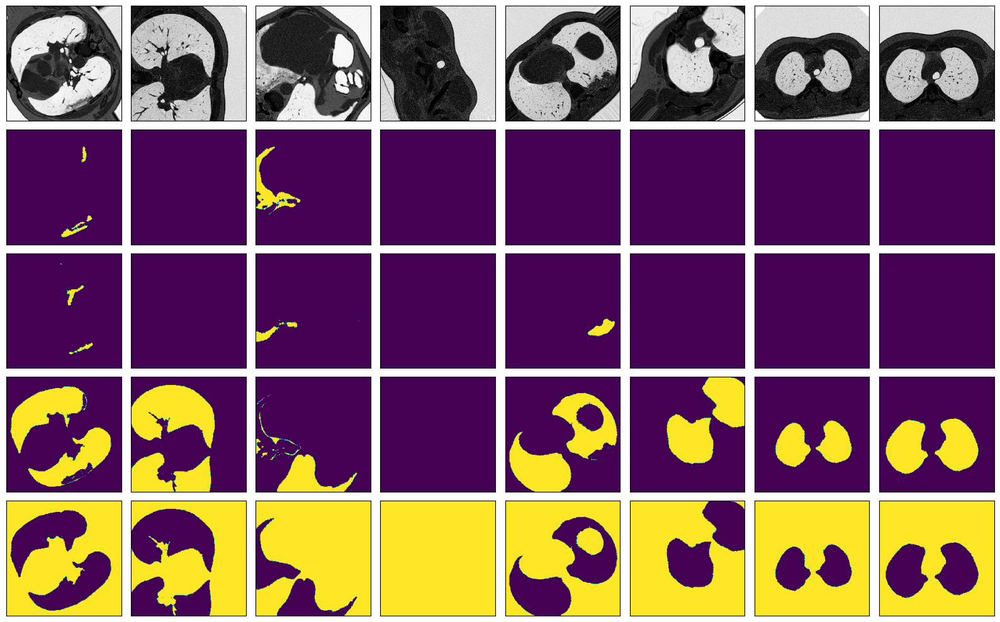

In [22]:
visualize(*next(iter(train_dataloader)))

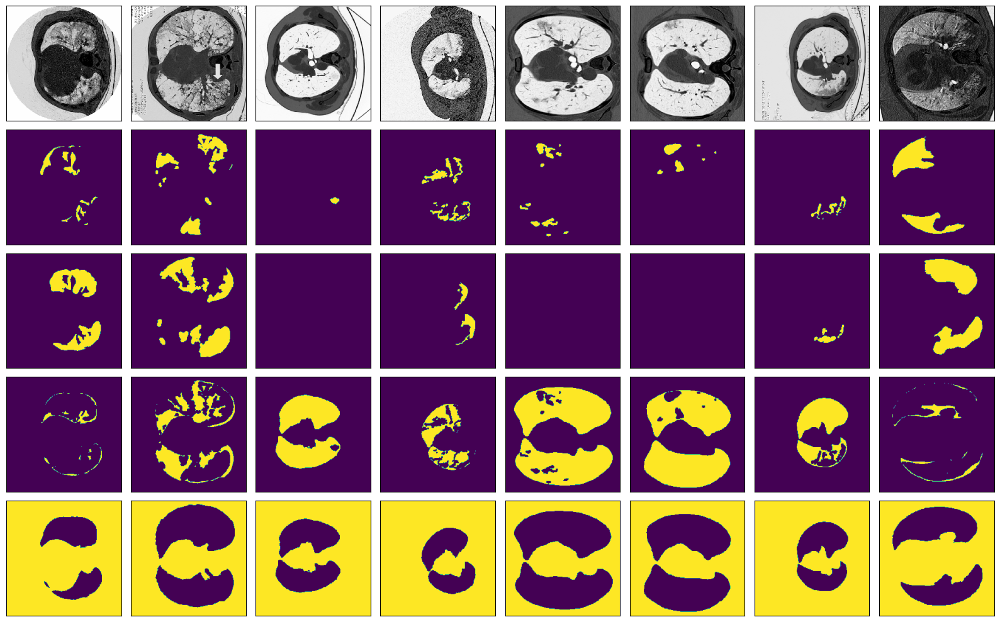

In [23]:
visualize(*next(iter(val_dataloader)))

# Model

In [24]:
#from keras.layers.advanced_activations import ELU
from keras.layers import ELU, PReLU, LeakyReLU

In [6]:
from tensorflow.keras import Input, Model
from tensorflow.keras.layers import Conv2D, Concatenate, UpSampling2D, Input, BatchNormalization, Activation
from keras.layers import ELU, PReLU, LeakyReLU

In [10]:
strategy = tf.distribute.MirroredStrategy()
print('Number of devices: {}'.format(strategy.num_replicas_in_sync))

Number of devices: 1


# ELUnet-MobilenetV3 Encoder

In [5]:
def elunet_MobileNetV3(input_shape):
    encoder = tf.keras.applications.MobileNetV3Small(input_shape=(input_shape[0], input_shape[1], 3), include_top=False, weights='imagenet')
    encoder.trainable = False

    encoder_outputs = [
        encoder.get_layer('expanded_conv_6/project/BatchNorm').output,  # 32x32
        encoder.get_layer('expanded_conv_4/project/BatchNorm').output,  # 64x64
        encoder.get_layer('expanded_conv_3/squeeze_excite/Conv_1').output,  # 128x128
        encoder.get_layer('expanded_conv_1/project/BatchNorm').output   # 256x256
    ]
    
 
    # Downsampling path (contracting path)
    inputs = tf.keras.Input(shape=input_shape)
    x = tf.keras.layers.Conv2D(3, (1, 1), activation='elu')(inputs)
    skips = []
    for down in encoder_outputs:
        x = tf.keras.layers.Conv2D(filters=32, kernel_size=3, activation='elu', padding='same')(x)
        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.Conv2D(filters=32, kernel_size=3, activation='elu', padding='same')(x)
        x = tf.keras.layers.BatchNormalization()(x)
        skips.append(x)
        x = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(x)
 
    # Bottleneck
    x = tf.keras.layers.Conv2D(filters=64, kernel_size=3, activation='elu', padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Conv2D(filters=64, kernel_size=3, activation='elu', padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
 
    # Upsampling path (expanding path)
    for up, skip in zip(reversed(encoder_outputs), reversed(skips)):
        x = tf.keras.layers.UpSampling2D(size=(2, 2))(x)
        x = tf.keras.layers.Concatenate()([x, skip])
        x = tf.keras.layers.Conv2D(filters=32, kernel_size=3, activation='elu', padding='same')(x)
        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.Conv2D(filters=32, kernel_size=3, activation='elu', padding='same')(x)
        x = tf.keras.layers.BatchNormalization()(x)
 
    # Output
    outputs = tf.keras.layers.Conv2D(filters=4, kernel_size=1, activation='softmax')(x)
 
    # Create the model
    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    return model

In [11]:
input_shape = (TARGET_SIZE, TARGET_SIZE, 1)  # Adjust the number of channels according to the data
with strategy.scope():
    model = elunet_MobileNetV3(input_shape)
    model.compile(loss = "categorical_crossentropy",
                optimizer = tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07), 
              
                metrics = (['accuracy', tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.MeanIoU(num_classes=4),
                        tf.keras.metrics.Recall(name='recall'),
                        tf.keras.metrics.AUC(name='AUC'),
                        f1_score, specificity, sensitivity, iou, dice_coefficient,tversky]))

print(model.input_shape)
print(model.output_shape)
model.summary()

4334752/4334752 [==============================] - 1s 0us/step
(None, 224, 224, 1)
(None, 224, 224, 4)
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 224, 224, 3)  6           ['input_2[0][0]']                
                                                                                                  
 conv2d_1 (Conv2D)              (None, 224, 224, 32  896         ['conv2d[0][0]']                 
                                )                                                         

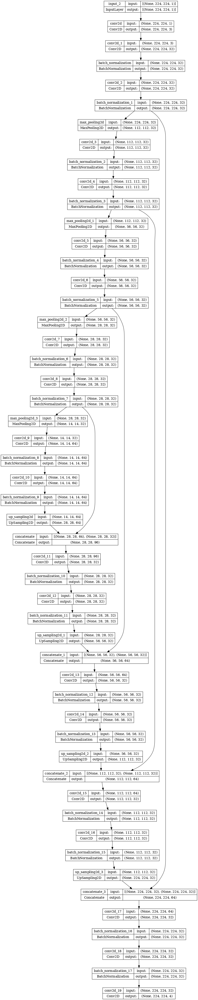

In [29]:
tf.keras.utils.plot_model(model, 
           show_shapes = True,
           show_dtype=False,
           show_layer_names = True, 
           rankdir = 'TB', 
           expand_nested = False, 
           dpi = 70)

In [14]:
model.layers

# Train

In [30]:
%%time
history = model.fit(
    train_dataloader,
    steps_per_epoch=len(train_dataloader) * 6,
    epochs = 10,
    validation_data = val_dataloader,
    validation_steps = len(val_dataloader),
    callbacks=callbacks,
    workers = 4)

Epoch 1/10

222/222 [==============================] - 69s 197ms/step - loss: 0.1849 - accuracy: 0.9585 - precision: 0.9681 - mean_io_u: 0.3750 - recall: 0.9493 - AUC: 0.9918 - f1_score: 0.9572 - specificity: 0.9896 - sensitivity: 0.9493 - iou: 0.8223 - dice_coefficient: 0.8961 - tversky: 0.8960 - val_loss: 1.9052 - val_accuracy: 0.7207 - val_precision: 0.7207 - val_mean_io_u: 0.3750 - val_recall: 0.7207 - val_AUC: 0.8113 - val_f1_score: 0.7207 - val_specificity: 0.9069 - val_sensitivity: 0.7207 - val_iou: 0.5554 - val_dice_coefficient: 0.7141 - val_tversky: 0.7141 - lr: 0.0010

Epoch 2/10

222/222 [==============================] - 39s 175ms/step - loss: 0.0865 - accuracy: 0.9745 - precision: 0.9774 - mean_io_u: 0.3750 - recall: 0.9722 - AUC: 0.9979 - f1_score: 0.9748 - specificity: 0.9925 - sensitivity: 0.9722 - iou: 0.9150 - dice_coefficient: 0.9555 - tversky: 0.9554 - val_loss: 0.2529 - val_accuracy: 0.9256 - val_precision: 0.9335 - val_mean_io_u: 0.3750 - val_recall: 0.9209 - val_

In [31]:
model.save("Model-MOB.h5")
print('Model save to Disk')

Model save to Disk


# Results

In [32]:
import pandas as pd
df = pd.DataFrame(history.history) 
df.to_excel("outputMOB.xlsx")
#df.to_csv("output1.csv")
df.head(10)

,loss,accuracy,precision,mean_io_u,recall,AUC,f1_score,specificity,sensitivity,iou,...,val_mean_io_u,val_recall,val_AUC,val_f1_score,val_specificity,val_sensitivity,val_iou,val_dice_coefficient,val_tversky,lr
0,0.184894,0.958520,0.968144,0.374986,0.949280,0.991812,0.957200,0.989587,0.949280,0.822319,...,0.375,0.720712,0.811323,0.720713,0.906904,0.720712,0.555381,0.714141,0.714141,0.001
1,0.086473,0.974467,0.977439,0.374986,0.972228,0.997878,0.974823,0.992518,0.972228,0.914955,...,0.375,0.920889,0.987515,0.927165,0.978142,0.920889,0.836244,0.910820,0.910820,0.001
2,0.062694,0.979078,0.981371,0.374986,0.977318,0.998876,0.979337,0.993815,0.977319,0.936715,...,0.375,0.927146,0.990115,0.932095,0.979255,0.927146,0.837406,0.911509,0.911509,0.001
3,0.059276,0.980393,0.982496,0.374986,0.978804,0.998931,0.980642,0.994186,0.978804,0.942087,...,0.375,0.746042,0.888461,0.752608,0.921164,0.746042,0.577995,0.732569,0.732569,0.001
4,0.064080,0.978678,0.980989,0.374986,0.976904,0.998805,0.978937,0.993688,0.976904,0.935800,...,0.375,0.933391,0.990114,0.937454,0.980687,0.933391,0.850170,0.919018,0.919018,0.001
5,0.048189,0.982997,0.984918,0.374986,0.981501,0.999308,0.983204,0.994989,0.981501,0.950194,...,0.375,0.937548,0.991133,0.941930,0.982284,0.937548,0.866393,0.928414,0.928414,0.001
6,0.045177,0.983800,0.985619,0.374986,0.982378,0.999381,0.983993,0.995221,0.982378,0.953173,...,0.375,0.937169,0.992422,0.942040,0.982503,0.937169,0.863313,0.926643,0.926643,0.001
7,0.044745,0.983886,0.985613,0.374985,0.982506,0.999358,0.984055,0.995219,0.982507,0.954060,...,0.375,0.919211,0.982278,0.921815,0.974954,0.919211,0.831945,0.908264,0.908264,0.001
8,0.041530,0.984911,0.986594,0.374986,0.983573,0.999472,0.985079,0.995544,0.983574,0.956613,...,0.375,0.928775,0.989691,0.935241,0.980868,0.928775,0.843892,0.915338,0.915338,0.001
9,0.037804,0.986074,0.987507,0.374986,0.984909,0.999546,0.986205,0.995846,0.984909,0.960016,...,0.375,0.940978,0.992831,0.945497,0.983513,0.940978,0.875166,0.933428,0.933428,0.001


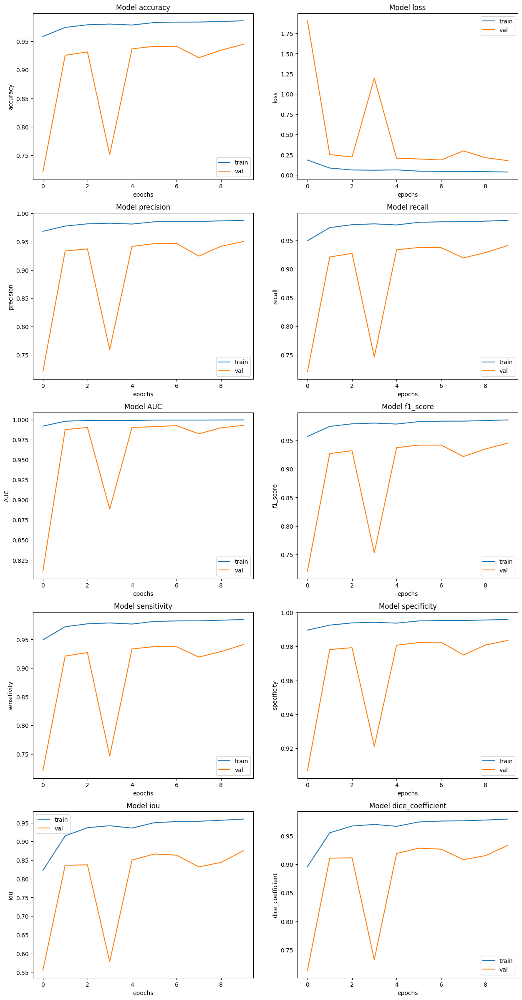

In [33]:
# Interpreting the Metrics
fig, ax = plt.subplots(5, 2, figsize=(15, 30))
ax = ax.ravel()

for i, met in enumerate(['accuracy', 'loss', 'precision', 'recall', 'AUC', 'f1_score','sensitivity', 'specificity','iou', 'dice_coefficient']):
    ax[i].plot(history.history[met])
    ax[i].plot(history.history['val_' + met])
    ax[i].set_title('Model {}'.format(met))
    ax[i].set_xlabel('epochs')
    ax[i].set_ylabel(met)
    ax[i].legend(['train', 'val'])
plt.savefig("Model-Results-MOB.png")

# Test model and inference Time

In [34]:
%%time
# Evaluate the model on the test data using `evaluate`
#print("Evaluate on test data")
results = model.evaluate(val_dataloader, batch_size=16, callbacks= callbacks)
print("test loss test acc:", results)

1/1 [==============================] - 0s 306ms/step - loss: 0.1781 - accuracy: 0.9448 - precision: 0.9501 - mean_io_u: 0.3750 - recall: 0.9410 - AUC: 0.9928 - f1_score: 0.9455 - specificity: 0.9835 - sensitivity: 0.9410 - iou: 0.8752 - dice_coefficient: 0.9334 - tversky: 0.9334

test loss test acc: [0.17814843356609344, 0.9447511434555054, 0.9500608444213867, 0.37499991059303284, 0.9409778118133545, 0.9928309917449951, 0.945497453212738, 0.9835127592086792, 0.9409778118133545, 0.8751662969589233, 0.9334279298782349, 0.9334277510643005]

CPU times: user 339 ms, sys: 12.9 ms, total: 352 ms

Wall time: 529 ms


In [51]:
%%time
model = tf.keras.models.load_model('Model-MOB.h5',
                                           compile=False,
                                           custom_objects={
                                                'Accuracy': 'accuracy', 
                                                'Precision': tf.keras.metrics.Precision(), 
                                                'Recall': tf.keras.metrics.Recall()})

model.compile(Adam(learning_rate=0.001, amsgrad=True),
              loss = "categorical_crossentropy")

CPU times: user 559 ms, sys: 12.5 ms, total: 571 ms

Wall time: 570 ms


In [52]:
def calculate_severity(mask):
    # Count the number of pixels in the mask
    total_pixels = mask.shape[0] * mask.shape[1]
    
    # Compute the percentage of infected pixels
    infected_pixels = np.count_nonzero(mask)
    severity_percentage = (infected_pixels / total_pixels) * 100
    
    return severity_percentage

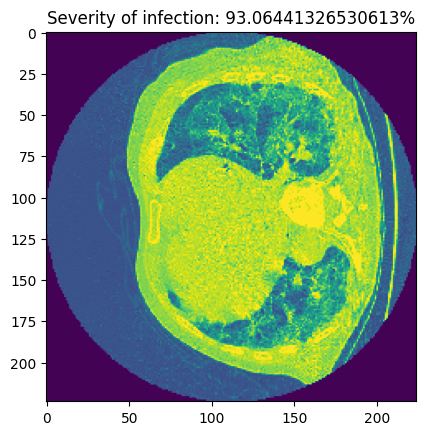

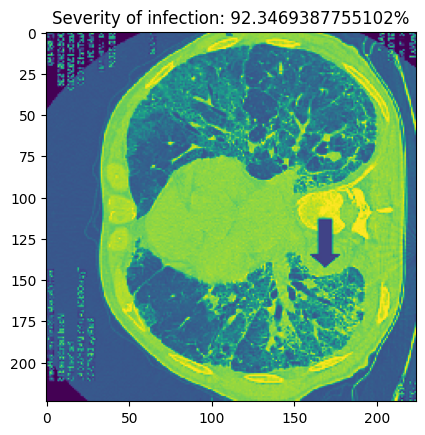

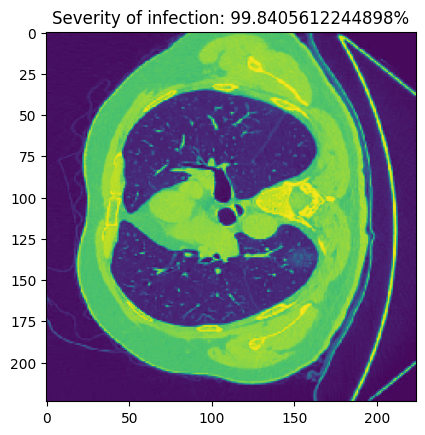

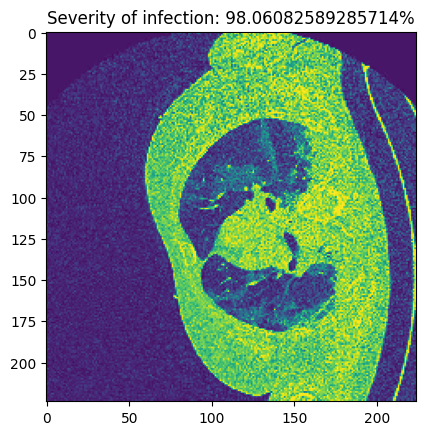

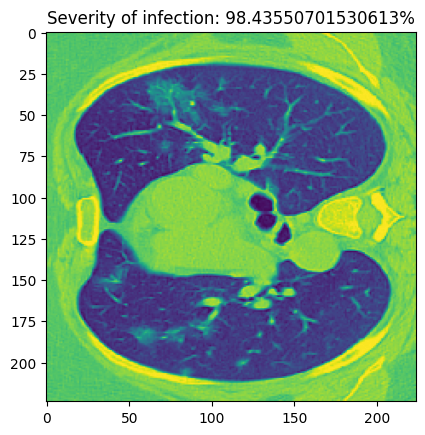

...

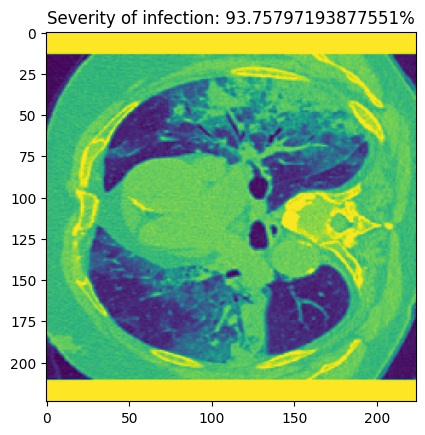

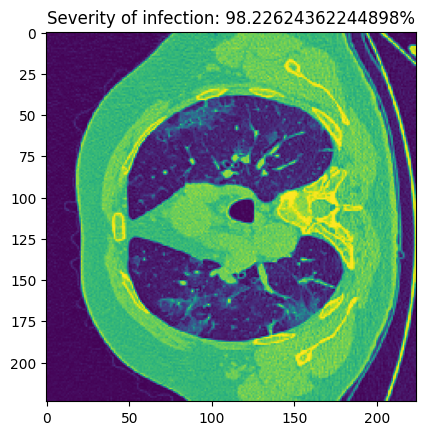

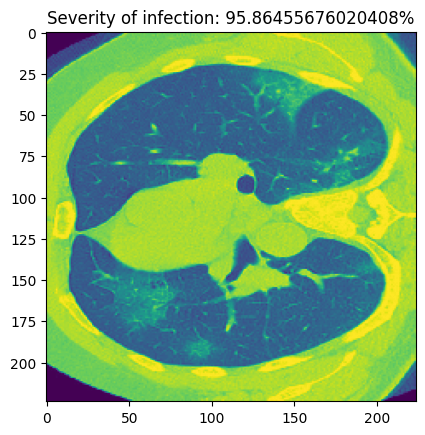

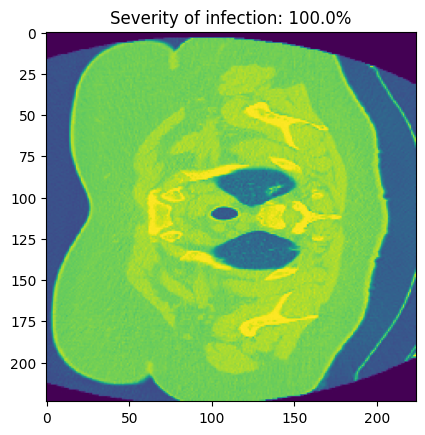

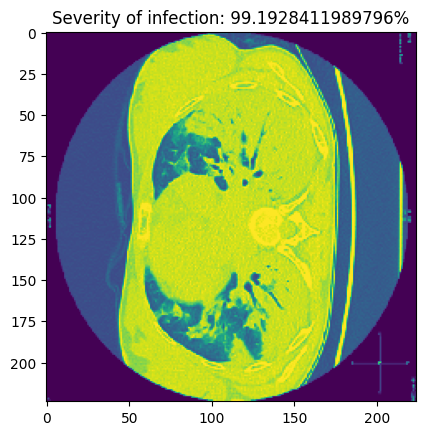

CPU times: user 8.77 s, sys: 1.99 s, total: 10.8 s

Wall time: 7.54 s


In [53]:
%%time
input = val_dataloader[0]
image_batch, mask_batch = input

preds = model.predict_on_batch(image_batch)
#visualize(image_batch, mask_batch, pred_batch=preds)

for i in range(len(preds)):
    # Get the i-th predicted mask and corresponding image from the batch
    pred_mask = preds[i]
    image = image_batch[i]
    
    # Convert the predicted mask to a binary image 
    pred_mask_binary = np.argmax(pred_mask, axis=-1).astype(np.uint8)
    
    # Calculate the severity percentage for the predicted mask
    severity_percentage = calculate_severity(pred_mask_binary)
    
    # Display the severity percentage and the corresponding image
    plt.imshow(image)
    plt.title(f"Severity of infection: {severity_percentage}%")
    plt.show()


Accuracy: 0.9701753992612671


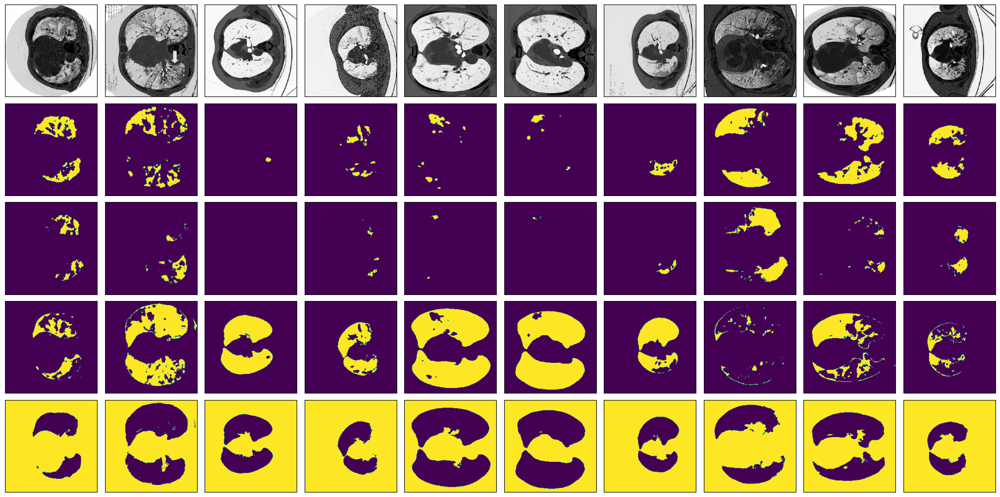

CPU times: user 3.55 s, sys: 185 ms, total: 3.73 s

Wall time: 3.45 s


In [64]:
%%time
model = tf.keras.models.load_model('Model-MOB.h5',
                                   compile=False)

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001, amsgrad=True),
              loss="categorical_crossentropy",
              metrics = (['accuracy', tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.MeanIoU(num_classes=4),
                        tf.keras.metrics.Recall(name='recall'),
                        tf.keras.metrics.AUC(name='AUC'),
                        specificity, sensitivity, iou, dice_coefficient,tversky]))

input = val_dataloader[0]
image_batch, mask_batch = input

preds = model.predict_on_batch(image_batch)

test_masks_prediction = preds > 0.3
# Calculate accuracy
accuracy = np.mean(test_masks_prediction == mask_batch)

# Print the accuracy score
print('Accuracy:', accuracy)
visualize(image_batch, test_masks_prediction, num_samples=len(test_images_medseg))

# Quantization

In [66]:
converter = tf.lite.TFLiteConverter.from_keras_model(model)
converter.optimizations = [tf.lite.Optimize.DEFAULT]
tflite_quant_model = converter.convert()

open("converted_quant_model.tflite", "wb").write(tflite_quant_model)


285064

In [68]:
print("Float model in Mb:", os.path.getsize('converted_quant_model.tflite') / float(2**20))
print("Quantized model in Mb:", os.path.getsize('converted_quant_model.tflite') / float(2**20))
print("Compression ratio:", os.path.getsize('converted_quant_model.tflite')/os.path.getsize('converted_quant_model.tflite'))

Float model in Mb: 0.27185821533203125

Quantized model in Mb: 0.27185821533203125

Compression ratio: 1.0
